In [2]:
import os
import torch
from torch import nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('Agg')
import numpy as np
from torchvision.io import read_image


from PIL import Image
from torch.nn import Module, Sequential , ConvTranspose2d, ReLU, Tanh, BatchNorm2d

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")



# Create Class for my Dataset, aimed at structuring the data in a way that is acceptable by pytorch 
class CustomImageDataset(Dataset):
    def __init__(self, transform=None, target_transform=None, mode='Train'):
         
        self.path_to_cow = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode,'Cow')
        self.path_to_horse = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode, 'Horse')


        #for i in os.listdir(self.path_to_cow):
        #os.path.join(self.path_to_cow, i)
        self.img_dir_cow = [os.path.join(self.path_to_cow, i) for i in os.listdir(self.path_to_cow)]
        self.img_dir_horse = [os.path.join(self.path_to_horse, i) for i in os.listdir(self.path_to_horse)]
        self.img_dir = self.img_dir_cow + self.img_dir_horse
        
        self.nbre_images = len(self.img_dir)
        self.labels = np.zeros(self.nbre_images)
        self.labels[0:len(self.img_dir_cow)] = 1

        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return self.nbre_images

    def __getitem__(self, idx):
        image = read_image(self.img_dir[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label


transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((64,64)),
            transforms.ToTensor()
            ]) 

transform0 = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((64,64)),
            transforms.ToTensor()
            ])

transform1 = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


transform2 = transforms.Compose([
            transforms.ToPILImage(),
            transforms.RandomResizedCrop(150),
            #transforms.Pad(padding=8, fill=0, padding_mode='constant'),
            #transforms.ColorJitter(brightness=0.75, hue=0.5),
            transforms.Resize((256,256)),
            transforms.ToTensor()
            ])


#transform1 = transforms.Compose([
            #transforms.ToPILImage(),
            #transforms.CenterCrop(size=(150, 150)),
            #transforms.Resize((256,256)),
            #transforms.ToTensor()
            #])





Using cpu device


In [ ]:
# Creating the trainloader

batch_size = 4
trainset = CustomImageDataset(transform= transform) # Creating an instance of the class
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

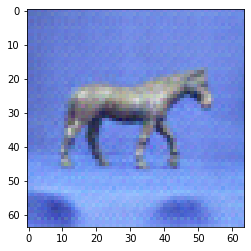

In [ ]:
# Display image and label.
%matplotlib inline
train_features, train_labels = next(iter(trainloader))
img = train_features[0].permute(1,2,0)
label = train_labels[0]
plt.imshow(img, cmap="gray")
plt.show()

In [ ]:
# For unzipping the data
#!unzip -u /content/drive/MyDrive/Newdata-20230313.zip -d /content/drive/MyDrive/GAN

In [ ]:
class MyNeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3,16,(5,5))
        self.pool = nn.MaxPool2d(4)
        self.conv2= nn.Conv2d(16,8,(3,3))
        self.pool2 = nn.MaxPool2d(2)
        self.Relu = nn.ReLU()
        self.flatten = nn.Flatten()
        self.FC1 = nn.Linear(288,80)
        self.FC2 = nn.Linear(80,2)


    def forward(self, x):
        x = self.Relu(self.conv1(x))
        x = self.pool(x)
        x = self.Relu(self.conv2(x))
        x = self.pool2(x)
        x = self.flatten(x)
        x =self.Relu(self.FC1(x.view(-1,288)))
        x = nn.functional.softmax(self.FC2(x), dim=1)
        return x

   
Mymodel = MyNeuralNetwork()
Mymodel.to(device)
#print(Mymodel)
n_epochs = 100
# Constructing our optimizer and specifying the parameters we want to optimize
optimizer = optim.SGD(Mymodel.parameters(), lr =0.001)
criterion = nn.CrossEntropyLoss() # Loss Function

for epoch in range(n_epochs):  # loop over the dataset multiple times
    
      running_loss = 0.0
      for i, data in enumerate(trainloader, 0):
          # get the inputs; data is a list of [inputs, labels]
          inputs, labels = data

          # zero the parameter gradients
          optimizer.zero_grad()  # The gradient usually is set to zero at every sample iteration. However, it seems this library doesnt do that automatically hence we do itr

          # forward + backward + optimize
          outputs = Mymodel(inputs.to(device))
          loss = criterion(outputs, labels.to(device).long()) # Difference between cross entropy and negative log likelihood
          loss.backward() # Computes the gradient for every parameter
          optimizer.step() # Update the weights
        
          # print statistics
          running_loss += loss.item() 
          #if i % 20 == 0:     # print every 2000 mini-batches
          #print(f'[{epoch + 1}, {i + 1:5d}] - loss: {running_loss / 20:.3f}')
          #running_loss = 0.0
      print(running_loss)    
print('Finished Training')

166.64749377965927
166.42055147886276
166.20616155862808
165.9896019101143
165.7692700624466
165.53075897693634
165.27353632450104
164.97740131616592
164.63105654716492
164.1465398669243
163.51232063770294
162.79932910203934
161.92242419719696
160.7881737947464
159.2429022192955
156.99713695049286
153.78790950775146
148.8153936266899
141.19015860557556
130.07607504725456
116.48790329694748
103.72693490982056
94.37911376357079
88.52302542328835
84.93164196610451
82.73880916833878
81.27832335233688
80.30680593848228
79.54500344395638
79.06318628787994
78.65881195664406
78.34858691692352
78.09867864847183
77.89559376239777
77.74286985397339
77.59247097373009
77.48223730921745
77.36920472979546
77.29570922255516
77.2041645348072
77.12450021505356
77.0840775668621
77.0356328189373
76.98859623074532
76.93101665377617
76.90703597664833
76.87250941991806
76.82967111468315
76.80864268541336
76.78563469648361
76.75550779700279
76.82219898700714
76.71133854985237
76.68405178189278
76.676348567008

In [ ]:
#print(inputs.size())

In [ ]:
# Test Phase
testset = CustomImageDataset(transform= transform, mode='Test')
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=True, num_workers=2)

In [ ]:
#Mymodel = MyNeuralNetwork()
#Mymodel.to(device)

In [ ]:
#from prompt_toolkit import output
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in testloader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = Mymodel(images.type(torch.float).to(device))
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1) # Ask Tabia
        total += batch_size# Calculating the total number of images
        correct += (predicted.to(device) == labels.to(device)).sum().item() # Calculating the number of correctly predicted images
print(f'The Accuracy of the network on the {testset.nbre_images} test images: {100 * correct // total} %')


The Accuracy of the network on the 82 test images: 40 %


In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in trainloader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = Mymodel(images.to(device))
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1) # Ask Tabia
        total += batch_size # Calculating the total number of images
        correct += (predicted.to(device) == labels.to(device)).sum().item() # Calculating the number of correctly predicted images
print(f'The Accuracy of the network on the train images: {100 * correct // total} %')



The Accuracy of the network on the train images: 99 %


# Building a Generative Adverserial Neural Network
 

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")



# Create Class for my Dataset, aimed at structuring the data in a way that is acceptable by pytorch 
class CustomImageDataset(Dataset):
    def __init__(self, transform=None, target_transform=None, mode='Train'):
        if mode == "Test":
          self.path_to_cow = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode,'Shape1')
          self.path_to_horse = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode,'Shape2')
        else:  
          self.path_to_cow = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode,'Cow')
          self.path_to_horse = os.path.join('drive', 'MyDrive','GAN', 'Newdata', mode,'Horse')


        #for i in os.listdir(self.path_to_cow):
        #os.path.join(self.path_to_cow, i)
        #self.img_dir = [os.path.join(self.path_to_cow, i) for i in os.listdir(self.path_to_cow)]
        self.img_dir = [os.path.join(self.path_to_horse, i) for i in os.listdir(self.path_to_horse)]
        #self.img_dir = self.img_dir_cow + self.img_dir_horse
        self.nbre_images = len(self.img_dir)
        self.labels = np.ones(self.nbre_images)

        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return self.nbre_images

    def __getitem__(self, idx):
        image = read_image(self.img_dir[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label


transform0 = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((64,64)),
            transforms.ToTensor()
            ])


Using cpu device


In [4]:
def plot_images(imgs, grid_size = 5):
  fig = plt.figure(figsize = (8,8))
  columns = rows = grid_size
  plt.title("Training Images")

  for i in range(1, columns*rows +1):
    plt.axis("off")
    fig.add_subplot(rows, columns, i)
    plt.imshow(imgs)
  plt.show

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class generator1(nn.Module) : 
  
  def __init__(self) : 
    super().__init__() 
    self.gen=Sequential(
        ConvTranspose2d(in_channels=10, out_channels=1024,kernel_size=4,stride=1,padding=0, bias= False),
        BatchNorm2d(num_features=1024),
        ReLU(inplace= True),

        ConvTranspose2d(in_channels=1024, out_channels=512,kernel_size=4,stride=2,padding=1, bias= False),
        BatchNorm2d(num_features=512),
        ReLU(inplace= True),

        ConvTranspose2d(in_channels=512, out_channels=256,kernel_size=4,stride=2,padding=1, bias= False),
        BatchNorm2d(num_features=256),
        ReLU(inplace= True),

        ConvTranspose2d(in_channels=256, out_channels=128,kernel_size=4,stride=2,padding=1, bias= False),
        BatchNorm2d(num_features=128),
        ReLU(inplace= True),

        ConvTranspose2d(in_channels=128, out_channels=3,kernel_size=4,stride=2,padding=1, bias= False),
        Tanh())

  def forward(self,input): 
      return self.gen(input)


myGenerator = generator1()
myGenerator.to(device)
#print(myGenerator)

generator1(
  (gen): Sequential(
    (0): ConvTranspose2d(10, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
 

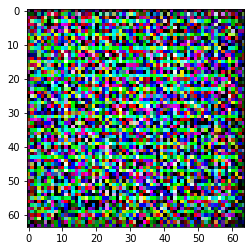

In [ ]:
%matplotlib inline
noise = torch.randn(1, 10, 1,1)
z = torch.randint(0, 255,(1,10), dtype=torch.float32)
z = myGenerator(noise.to(device)).cpu()
z = z.detach().squeeze().permute(1, 2, 0).numpy()
plt.imshow(z)
plt.show()

In [ ]:
myGenerator.apply(weights_init)

generator1(
  (gen): Sequential(
    (0): ConvTranspose2d(10, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
 

In [ ]:
ndf = 64
nc = 3
ngpu = 1
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)



myDiscriminator = Discriminator(ngpu)
myDiscriminator.to(device)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [ ]:
myDiscriminator.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

Starting Training Loop...


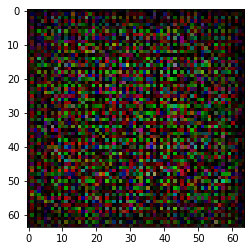

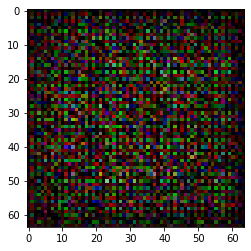

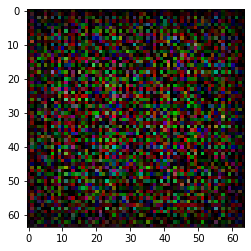

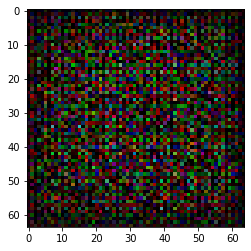

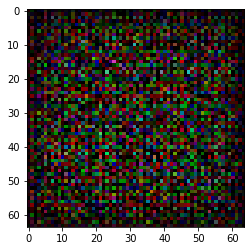

...

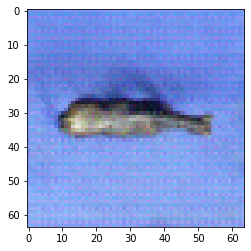

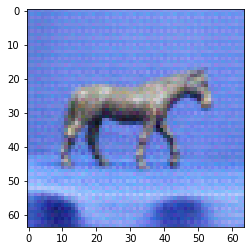

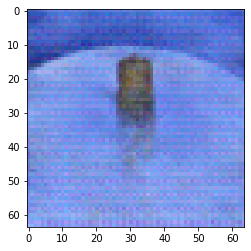

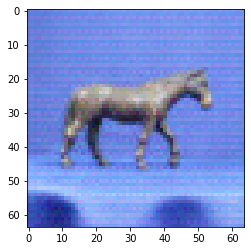

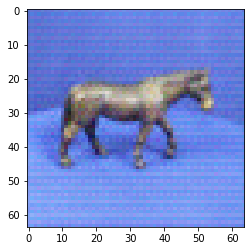

Finished Training


In [ ]:

optimizer_D = optim.Adam(myDiscriminator.parameters(), lr = 0.0002, betas = (0.5, 0.999))
#criterion_D = nn.BCELoss()
optimizer_G = optim.Adam(myGenerator.parameters(), lr = 0.0002, betas = (0.5, 0.999))
loss = nn.BCELoss()

batch_size = 1
trainset = CustomImageDataset(transform= transform0) # Creating an instance of the class
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)


print("Starting Training Loop...")


n_of_epochs = 500

for e in range(n_of_epochs):

  running_loss_D = 0.0
  for i, data in enumerate(trainloader, 0):

    ##########################
    ## Update Discriminator ##
    ##########################  

    ''' 
    Loss on Real Images
  
    '''

    inputs, b = data
    optimizer_D.zero_grad()
    predicted = myDiscriminator(inputs.to(device))
    labels = torch.ones(len(b), 1, 1,1, dtype=torch.float, device=device)# real
    loss_real = loss(predicted, labels.to(device))
    loss_real.backward()

    ''' 
    Loss on fake Images
  
    '''
    noise = torch.randn(1, 10, 1,1)
    fake_image = myGenerator(noise.to(device))
    predicted = myDiscriminator(fake_image.detach())
    target = torch.zeros(len(b),1, 1, 1, dtype=torch.float, device=device)# fake
    loss_fake = loss(predicted, target)
    loss_fake.backward()

    loss_Discriminator = loss_real + loss_fake

    optimizer_D.step()
    



    ##########################
    #### Update Generator ####
    ##########################


    optimizer_G.zero_grad()
    predicted = myDiscriminator(fake_image)
    target = torch.ones(1, 1, 1,1, dtype=torch.float, device=device)# real for the generator
    loss_gen = loss(predicted, target)
    loss_gen.backward()
    optimizer_G.step()

    running_loss_D +=  loss_Discriminator.item() 

    ####################################
    #### Plot some Generator images ####
    ####################################

    # during every epoch, print images at every 10th iteration.
    if e % 100 == 0:
      %matplotlib inline
      noise = torch.randn(1, 10, 1,1)
      z = myGenerator(noise.to(device))
      z = z.cpu().detach().squeeze().permute(1, 2, 0).numpy()
      plt.imshow(z)
      plt.show()
      # convert the fake images from (b_size, 3, 32, 32) to (b_size, 32, 32, 3) for plotting 
      #z = torch.from_numpy(z)
      #img_plot = np.transpose(z.detach().cpu(), (0,2,3,1)) # .detach().cpu() is imp for copying fake_img tensor to host memory first
      #plot_images(img_plot)
      #print("********************")
      #print(" Epoch %d and iteration %d " % (e, i))


print('Finished Training')


tensor([[ 91.,  55.,  89., 202.,  68., 186., 219., 190.,  85.,  25.]])


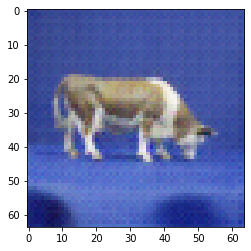

In [ ]:
%matplotlib inline
# Define the range
lower_bound = 0
upper_bound = 1

# Define the mean and standard deviation
mean = (lower_bound + upper_bound) / 2
std = (upper_bound - lower_bound) / 2

noise = torch.randn(1, 10, 1,1) * 0.2 + mean
#Image.fromarray((fake_image * 255).astype('uint8')).save('generated_image.png')




z = torch.randint(0, 255,(1,10), dtype=torch.float32)
print(z)
z = myGenerator(noise.to(device))
z = z.cpu().detach().squeeze().permute(1, 2, 0).numpy()
#print(z.size())
#img=np.array(z.type(torch.uint8))
plt.imshow(z)
plt.show()

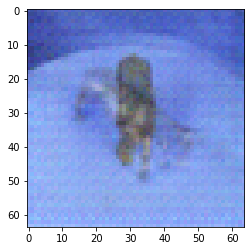

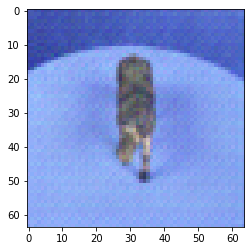

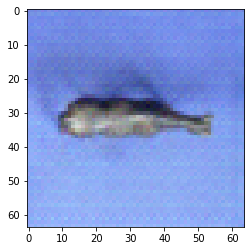

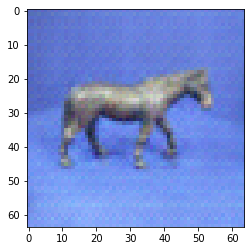

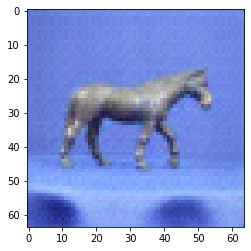

...

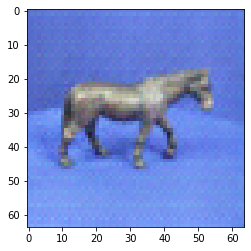

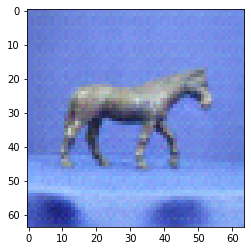

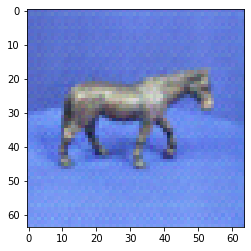

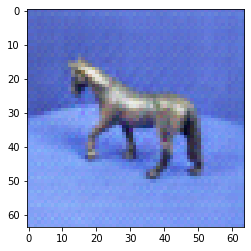

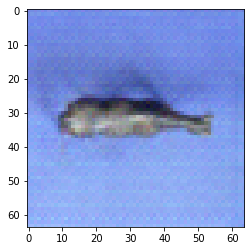

In [ ]:
# Generating Images and saving them

from torchvision.utils import save_image
for i in range (500):
  %matplotlib inline 
  noise = torch.randn(1,10,1,1 , device=device)
  fake_img=myGenerator(noise.to(device))
  save_image(fake_img,f'/content/drive/MyDrive/GAN/Newdata/Fake_image/Horse/2/{i}.png')
  fake_img=fake_img.cpu().detach().squeeze().permute(1,2,0).numpy()
  plt.imshow(fake_img)
  plt.show()